This notebook demonstrates how collision-free robot trajectories can be learnt using the the safemotions package. <br>
Note: Colab does not provide a display server, however, it is possible to render videos of the generated movements. 
When running the package on your local machine, you can add the command line argument "--use_gui" for instantaneous visualization. 

The robots in the following examples are controlled by neural networks that are trained to reach as many randomly sampled target points as possible without causing collisions. 

Examples:
1.   [One industrial robot](#t1), single target point, 
2.   [Two industrial robots](#t2), alternating target points
3.   [Three industrial robots](#t3), alternating target points
4.   [Humanoid robot ARMAR 6](#t4), simultaneous target points
5.   [Humanoid robot ARMAR 6](#t5), alternating target points
6.   [Humanoid robot ARMAR 6](#t6), single target point
7.   [Four-armed humanoid robot ARMAR 6x4](#t7), simultaneous target points
8.   [Four-armed humanoid robot ARMAR 6x4](#t8), alternating target points
9.   [Four-armed humanoid robot ARMAR 6x4](#t9), single target point

<font color='#75052d'>Red</font> and <font color='#0000aa'>blue</font> flashing of a robot link indicates that an alternative safe behavior is performed to prevent a collision with another robot link and a static obstacle, respectively. 

As a first step, run the following cell to install all required dependencies.


In [ ]:
# First step: clone the safemotions repository and install the dependencies
! git clone https://github.com/translearn/safeMotions.git
%cd safeMotions

! pip install pybullet==3.2.1 redis==3.5.3 prometheus-client==0.11.0 aiohttp==3.7.4.post0 aiohttp-cors==0.7.0 aioredis==1.3.1 ray[default]==1.4.1 ray[rllib]==1.4.1 klimits armar lz4 gym==0.18.3 jax==0.2.11
! pip install gputil

%matplotlib inline
# Use a renderer with hardware acceleration provided that a GPU is available. 
import GPUtil
try:
  renderer = "egl" if len(GPUtil.getGPUs()) > 0 else "cpu"
except:
  renderer = "cpu"
if renderer == "cpu":
  print("Using CPU renderer.")
else:
  print("Using GPU renderer.")

Cloning into 'safeMotions'...
remote: Enumerating objects: 561, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 561 (delta 5), reused 8 (delta 2), pack-reused 548
Receiving objects: 100% (561/561), 20.22 MiB | 22.19 MiB/s, done.
Resolving deltas: 100% (286/286), done.
/content/safeMotions
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 90.8 MB 1.5 MB/s 
     |████████████████████████████████| 72 kB 130 kB/s 
     |████████████████████████████████| 56 kB 1.0 MB/s 
     |████████████████████████████████| 1.3 MB 46.0 MB/s 
     |████████████████████████████████| 65 kB 1.2 MB/s 
     |████████████████████████████████| 51.6 MB 203 kB/s 
     |████████████████████████████████| 1.1 MB 60.4 MB/s 
     |████████████████████████████████| 57.5 MB 1.2 MB/s 
     |████████████████████████████████| 1.2 MB 51.6 MB/s 
     |██████████████████████

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for gputil: filename=GPUtil-1.4.0-py3-none-any.whl size=7411 sha256=44e3cf4e508bfae2c25a81420eee408800c542d2bfa9594aae99fb842e38fb8d
  Stored in directory: /root/.cache/pip/wheels/6e/f8/83/534c52482d6da64622ddbf72cd93c35d2ef2881b78fd08ff0c
Successfully built gputil
Using GPU renderer.




---

<a name="t1"></a>
1.   One industrial robot, single target point
<br>
Note: Since the virtual walls around the robot are transparent, only the GPU-based renderer can be used for this example. <br>




Instructions for updating:
experimental_relax_shapes is deprecated, use reduce_retracing instead
2022-11-08 09:19:57,939	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2022-11-08 09:20:01,355	INFO trainer.py:671 -- Tip: set framework=tfe or the --eager flag to enable TensorFlow eager execution
2022-11-08 09:20:01,357	INFO trainer.py:698 -- Current log_level is WARN. For more information, set 'log_level': 'INFO' / 'DEBUG' or use the -v and -vv flags.
INFO:root:Pos upper limits: [2.93205973 2.0593951  2.93205973 2.0593951  2.93205973 2.0593951
 3.01932619]
INFO:root:Pos lower limits: [-2.93205973 -2.0593951  -2.93205973 -2.0593951  -2.93205973 -2.0593951
 -3.01932619]
INFO:root:Vel limits: [1.71042267 1.71042267 1.74532925 2.26892803 2.44346095 3.14159265
 3.14159265]
INFO:root:Acc limits: [15.   7.5 10.  12.5 15.  20.  20. ]
INFO:root:Jerk limits: [300. 150. 200. 250. 300. 400. 400.]
INFO:root:Torque 

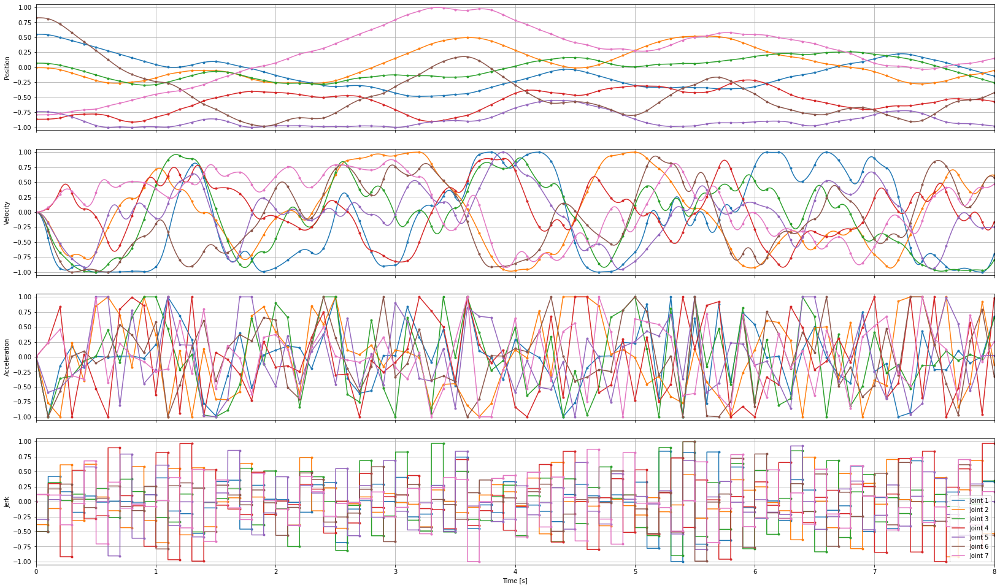

INFO:root:Computing episode 1 took 14.920298337936401 seconds
INFO:root:Trajectory duration: 8.0 seconds
INFO:root:Episode reward: 118.77032573726731
INFO:root:Computed 1 episode(s) in 16.017287731170654 seconds.
INFO:root:Mean computation time: 14.920298337936401 seconds, Max computation time: 14.920298337936401 seconds.


In [ ]:
import os
from IPython.display import HTML, display
from base64 import b64encode
video_height = 720
video_frame_rate = 24
video_width = int(16/9 * video_height)
if renderer == "cpu":
  print("This example requires a GPU-based renderer as the walls around the robot are transparent. Unfortunately, transparency is not supported by the cpu renderer. Try to run the other examples instead.")
else:
  %run -G safemotions/evaluate.py --checkpoint=industrial/one_robot/collision --online_trajectory_duration=8.0 --plot_trajectory --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=8 --video_height=$video_height --fixed_video_filename --video_dir="/content"
  video_filename = os.path.join("/content", "episode_1.mp4")
  video_file = open(video_filename,'rb').read()
  url = "data:video/mp4;base64," + b64encode(video_file).decode()
  display(HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url)))



---

<a name="t2"></a>
2.   Two industrial robots, alternating target points
<br>

2022-11-07 21:38:49,585	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2022-11-07 21:38:49,592	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [2.93205973 2.0593951  2.93205973 2.0593951  2.93205973 2.0593951
 3.01932619 2.93205973 2.0593951  2.93205973 2.0593951  2.93205973
 2.0593951  3.01932619]
INFO:root:Pos lower limits: [-2.93205973 -2.0593951  -2.93205973 -2.0593951  -2.93205973 -2.0593951
 -3.01932619 -2.93205973 -2.0593951  -2.93205973 -2.0593951  -2.93205973
 -2.0593951  -3.01932619]
INFO:root:Vel limits: [1.71042267 1.71042267 1.74532925 2.26892803 2.44346095 3.14159265
 3.14159265 1.71042267 1.71042267 1.74532925 2.26892803 2.44346095
 3.14159265 3.14159265]
INFO:root:Acc limits: [15.   7.5 10.  12.5 15.  20.  20.  15.   7.5 10.  12.5 15.  20.  20. ]
INFO:root:Jerk limits: [300. 150. 200. 250. 300. 400. 400. 300. 150. 200. 250. 

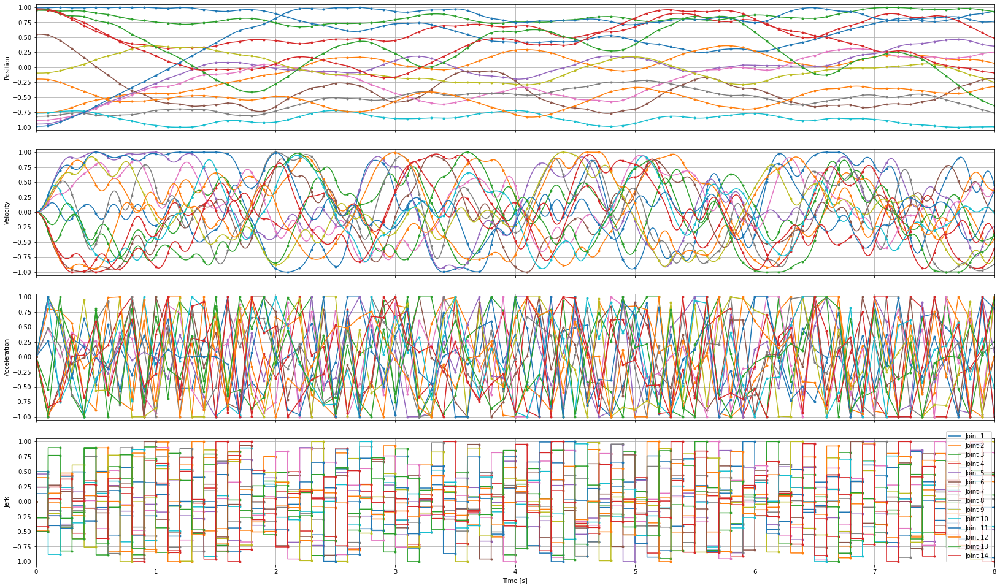

INFO:root:Computing episode 1 took 17.744373083114624 seconds
INFO:root:Trajectory duration: 8.0 seconds
INFO:root:Episode reward: 96.53342992823518
INFO:root:Computed 1 episode(s) in 18.318685054779053 seconds.
INFO:root:Mean computation time: 17.744373083114624 seconds, Max computation time: 17.744373083114624 seconds.


In [ ]:
import os
from IPython.display import HTML
from base64 import b64encode
if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G safemotions/evaluate.py --checkpoint=industrial/two_robots/collision/alternating --online_trajectory_duration=8.0 --plot_trajectory --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=8 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))



---

<a name="t3"></a>
3.   Three industrial robots, alternating target points

2022-11-07 21:40:23,834	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2022-11-07 21:40:23,850	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [2.93205973 2.0593951  2.93205973 2.0593951  2.93205973 2.0593951
 3.01932619 2.93205973 2.0593951  2.93205973 2.0593951  2.93205973
 2.0593951  3.01932619 2.93205973 2.0593951  2.93205973 2.0593951
 2.93205973 2.0593951  3.01932619]
INFO:root:Pos lower limits: [-2.93205973 -2.0593951  -2.93205973 -2.0593951  -2.93205973 -2.0593951
 -3.01932619 -2.93205973 -2.0593951  -2.93205973 -2.0593951  -2.93205973
 -2.0593951  -3.01932619 -2.93205973 -2.0593951  -2.93205973 -2.0593951
 -2.93205973 -2.0593951  -3.01932619]
INFO:root:Vel limits: [1.71042267 1.71042267 1.74532925 2.26892803 2.44346095 3.14159265
 3.14159265 1.71042267 1.71042267 1.74532925 2.26892803 2.44346095
 3.14159265 3.14159265 1.71042267 1.

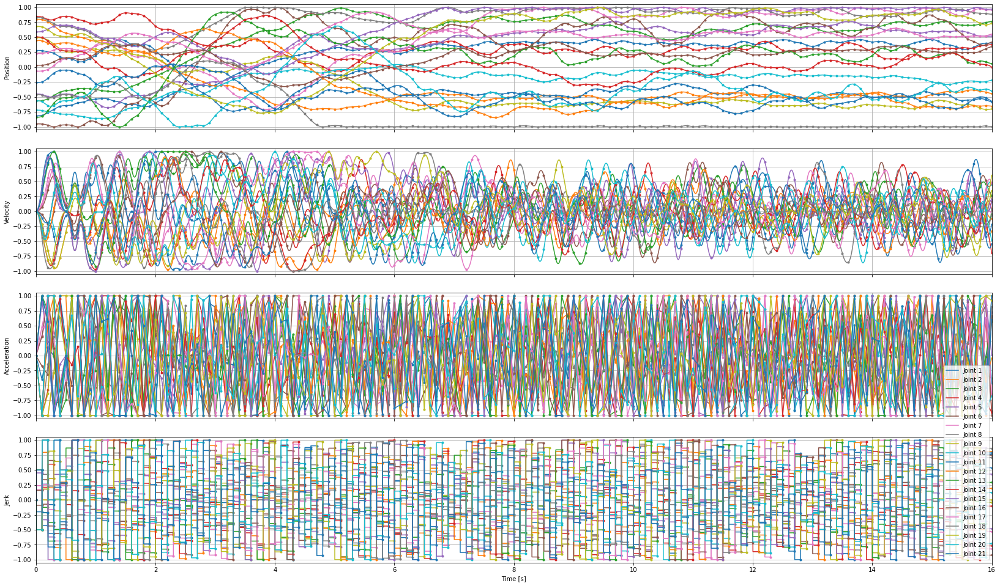

INFO:root:Computing episode 1 took 44.353283166885376 seconds
INFO:root:Trajectory duration: 16.0 seconds
INFO:root:Episode reward: -48.521862938654756
INFO:root:Computed 1 episode(s) in 45.24853157997131 seconds.
INFO:root:Mean computation time: 44.353283166885376 seconds, Max computation time: 44.353283166885376 seconds.


In [ ]:
import os
from IPython.display import HTML
from base64 import b64encode
if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G safemotions/evaluate.py --checkpoint=industrial/three_robots/collision/alternating --online_trajectory_duration=16.0 --plot_trajectory --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=8 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))



---

<a name="t4"></a>
4.   Humanoid robot ARMAR 6, simultaneous target points

In [ ]:
import os
from IPython.display import HTML
from base64 import b64encode
if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G safemotions/evaluate.py --checkpoint=humanoid/armar6/collision/simultaneous --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2022-11-07 21:41:33,298	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2022-11-07 21:41:33,318	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.365      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52      ]
INFO:root:Vel limits: [0.15       1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267]
INFO:root:Acc limits: [15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.]
INFO



---

<a name="t5"></a>
5.   Humanoid robot ARMAR 6, alternating target points

In [ ]:
import os
from IPython.display import HTML
from base64 import b64encode

if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G safemotions/evaluate.py --checkpoint=humanoid/armar6/collision/alternating --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2022-11-07 21:42:35,165	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2022-11-07 21:42:35,171	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.365      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52      ]
INFO:root:Vel limits: [0.15       1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267]
INFO:root:Acc limits: [15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.]
INFO



---

<a name="t6"></a>
6.   Humanoid robot ARMAR 6, single target point

In [ ]:
import os
from IPython.display import HTML
from base64 import b64encode

if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G safemotions/evaluate.py --checkpoint=humanoid/armar6/collision/single --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2022-11-07 21:43:36,492	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2022-11-07 21:43:36,500	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.365      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52      ]
INFO:root:Vel limits: [0.15       1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267
 1.71042267 1.71042267 1.71042267 1.71042267 1.71042267]
INFO:root:Acc limits: [15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.]
INFO



---

<a name="t7"></a>
7.   Four-armed humanoid robot ARMAR 6x4, simultaneous target points

In [ ]:
import os
from IPython.display import HTML
from base64 import b64encode

if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G safemotions/evaluate.py --checkpoint=humanoid/armar6_x4/collision/simultaneous --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2022-11-07 21:44:32,794	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2022-11-07 21:44:32,803	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52       1.3962634
 1.57079633 3.1        1.57079633 2.51       1.57079633 0.64
 1.52       1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.335      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52       -1.3962634
 -1.57079633 -0.24       -1.57079633  0.         -1.57079633 -0.64
 -1.52       -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 



---

<a name="t8"></a>
8.   Four-armed humanoid robot ARMAR 6x4, alternating target points

In [ ]:
import os
from IPython.display import HTML
from base64 import b64encode

if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G safemotions/evaluate.py --checkpoint=humanoid/armar6_x4/collision/alternating --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2022-11-07 21:45:53,404	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2022-11-07 21:45:53,409	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52       1.3962634
 1.57079633 3.1        1.57079633 2.51       1.57079633 0.64
 1.52       1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.335      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52       -1.3962634
 -1.57079633 -0.24       -1.57079633  0.         -1.57079633 -0.64
 -1.52       -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 



---

<a name="t9"></a>
9.   Four-armed humanoid robot ARMAR 6x4, single target point

In [ ]:
import os
from IPython.display import HTML
from base64 import b64encode

if renderer == "cpu":
  video_height = 360
  video_frame_rate = 15
else:
  video_height = 720
  video_frame_rate = 24
video_width = int(16/9 * video_height)

%run -G safemotions/evaluate.py --checkpoint=humanoid/armar6_x4/collision/single --online_trajectory_duration=8.0 --episodes=1 --render --renderer=$renderer --video_frame_rate=$video_frame_rate --camera_angle=9 --video_height=$video_height --fixed_video_filename --video_dir="/content"
video_filename = os.path.join("/content", "episode_1.mp4")
video_file = open(video_filename,'rb').read()
url = "data:video/mp4;base64," + b64encode(video_file).decode()
HTML("""<video width="%s" controls><source src="%s" type="video/mp4"></video>""" % (video_width, url))

2022-11-07 21:47:32,036	WARNING deprecation.py:34 -- DeprecationWarning: `register_custom_model` has been deprecated. This will raise an error in the future!
2022-11-07 21:47:32,043	INFO worker.py:746 -- Calling ray.init() again after it has already been called.
INFO:root:Pos upper limits: [0.         1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52       1.3962634  1.57079633 3.1
 1.57079633 2.51       1.57079633 0.64       1.52       1.3962634
 1.57079633 3.1        1.57079633 2.51       1.57079633 0.64
 1.52       1.3962634  1.57079633 3.1        1.57079633 2.51
 1.57079633 0.64       1.52      ]
INFO:root:Pos lower limits: [-0.335      -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 -1.57079633 -0.64       -1.52       -1.3962634  -1.57079633 -0.24
 -1.57079633  0.         -1.57079633 -0.64       -1.52       -1.3962634
 -1.57079633 -0.24       -1.57079633  0.         -1.57079633 -0.64
 -1.52       -1.3962634  -1.57079633 -0.24       -1.57079633  0.
 